# Sistema di Face Detection per una fotocamera digitale


### Introduzione
Il presente progetto si pone l'obiettivo di realizzare un sistema di Face Detection che, in quanto tale, dovrà essere in grado di identificare i volti umani presenti in un'immagine.

In particolare trattondosi di un progetto a scopo didattico il modello utilizzato dovrà essere addestrato da zero, non sarà quindi possibile utilizzare modelli già addestrati; inoltre, si ipotizza di non disporre di risorse di calcolo ingenti.


#### Face Detection
La Face Detection è una branca della Computer Vision (CV) che, come detto prima, ha lo scopo di identificare i volti umani presenti in un'immagine. Ad oggi, grazie anche alla facilità nell'acquisire immagini digitali, riveste un ruolo fondamentale in diversi campi e in moltissime applicazioni.
Algoritmi efficaci di CV nati con questo scopo esistono già da molti anni basti pensare a quello proposto da Paul Viola e Michael Jones nel 2001, basato sulle Haar Features in combinazione con un algoritmo AdaBoost. Oggi molti algoritmi di Face Detection si basano sull'utilizzo di reti neurali che riescono a garantire ottime prestazioni in questo ambito, tuttavia si trattta di algoritmi molto complessi e dall'elevato numero di parametri, che per essere addestrati da zero richiederebbero importanti risorse computazionali.

Considerando quindi l'elevato costo computazionale per addestare da zero sia un modello basato sul deep-learning sia un modello Haar Cascade classifier e l'impossibilità di utilizzare modelli già addestrati presenti in librerie come OpenCV e Dlib, si è deciso di utilizzare un SVM accoppiato a un metodo di Feature Extraction per la classificazione, in combinazione con algortimi in grado di localizzare un volto indipendentemente da posizione e dimensione, che verranno illustrati in seguito.

Si è deciso di utilizzare come modello di classificazione un SVM, in quanto in letteratura e più in generale online sono presenti diversi esempi di applicazione in questo campo che hanno ottenuto risultati soddisfacenti.


Le sezioni di questo notebook ricalcano i principali passaggi che sono stati eseguiti per la realizzazione di questo progetto:


1.   Costruzione del Dataset
2.   Feature Extraction
3. Addetramento, scelta e test del modello di classificazione
4. Realizzazione dell'algoritmo di face detection e prova dello stesso su foto reali


Bibliografia:

[Face detection techniques: a review](https://link.springer.com/article/10.1007/s10462-018-9650-2)

[Human Face Detection Techniques: A Comprehensive Review and Future Research Directions](https://www.mdpi.com/2079-9292/10/19/2354)

[Review and Comparison of Face Detection Techniques](https://link.springer.com/chapter/10.1007/978-981-15-0361-0_1)

[Face Detection Explained: State-of-the-Art Methods and Best Tools](https://medium.com/sciforce/face-detection-explained-state-of-the-art-methods-and-best-tools-f730fca16294)

[What is Face Detection? Ultimate Guide 2023 + Model Comparison](https://learnopencv.com/what-is-face-detection-the-ultimate-guide/)

[Histogram of Oriented Gradients and Object Detection](https://pyimagesearch.com/2014/11/10/histogram-oriented-gradients-object-detection/)


[Image Classification using HOG and LBP Feature Descriptors with SVM and CNN](https://www.ijert.org/image-classification-using-hog-and-lbp-feature-descriptors-with-svm-and-cnn)





In [ ]:
import pandas as pd
import numpy as np
import os
import shutil
import cv2
import matplotlib.pyplot as plt
from skimage.feature import hog, local_binary_pattern
from tensorflow.keras import datasets
import random
from sklearn.model_selection import train_test_split, cross_validate
import seaborn as sns
from sklearn.model_selection import train_test_split, KFold, RandomizedSearchCV, cross_validate
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, log_loss, confusion_matrix, make_scorer
from sklearn.svm import SVC
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline
from joblib import dump, load
from sklearn.datasets import fetch_olivetti_faces
from skimage.transform import pyramid_gaussian
from google.colab.patches import cv2_imshow
import time
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

### Funzioni

In [ ]:
def recall_0(y_true, y_pred):
  #Function to calculate the recall of the class 0
  return recall_score(y_true, y_pred, pos_label=0)

def precision_0(y_true, y_pred):
  #Function to calculate the precision of the class 0
  return precision_score(y_true, y_pred, pos_label=0)

In [ ]:
def hog_feature_calc(X):
  #Function to calculate HOG features
  hog_vals = hog(X,
                 orientations = 9,
                 pixels_per_cell = (4, 4),
                 cells_per_block = (2,2),
                 visualize = False,
                 feature_vector = True)
  return hog_vals


In [ ]:
def get_df_comp_CV(scores,model_params):
  #Function to create a dataframe with the metrics of several models

  df_comp = pd.DataFrame(columns=['accuracy','precision_1','precision_0','recall_1','recall_0','kernel','set'])

  for i in range(len(model_params)):
    list_add = [scores[i]['train_accuracy'].mean(),
                scores[i]['train_precision_1'].mean(),
                scores[i]['train_precision_0'].mean(),
                scores[i]['train_recall_1'].mean(),
                scores[i]['train_recall_0'].mean(),
                model_params[i],
                'Train']
    df_comp.loc[len(df_comp)] = list_add

    list_add = [scores[i]['test_accuracy'].mean(),
                scores[i]['test_precision_1'].mean(),
                scores[i]['test_precision_0'].mean(),
                scores[i]['test_recall_1'].mean(),
                scores[i]['test_recall_0'].mean(),
                model_params[i],
                'Test']
    df_comp.loc[len(df_comp)] = list_add

  return df_comp

In [ ]:
def lbp_feature_calc(X, radius = 2):
  #Function to calculate LBP features
  X_lbp = []

  n_points = 8*radius

  for i in range(X.shape[0]):
    #Image Normalization
    img = X[i]/255
    lbp_features = local_binary_pattern(img, P = n_points, R = radius)
    X_lbp.append(lbp_features)

  return np.array(X_lbp)

In [ ]:
def lbph_feature_calc(X, radius = 1, n_points = 8, grid_x = 8, grid_y = 8):

  #Function to calculate LBPH features

  X_lbph = []

  n_points = 8*radius

  for k in range(X.shape[0]):
    #Image Normalization
    img = X[k]/255

    lbp_hist = []
    for i in range(int(img.shape[0]/grid_x)):
      for j in range(int(img.shape[1]/grid_y)):

        lbp_features = local_binary_pattern(img[i*grid_y:(i+1)*grid_y, j*grid_x:(j+1)*grid_x],
                                            P = n_points,
                                            R = radius,
                                            method='uniform')

        #Histogram Calculation
        hist, _ = np.histogram(lbp_features.ravel(),
                               bins = np.arange(0,n_points+3),
                               range = (0, n_points+2))

        #Histogram Normalization
        hist = hist.astype("float")
        hist /= (hist.sum() + 1e-7)

        lbp_hist.append(hist)

    X_lbph.append(lbp_hist)

  X_lbph = np.array(X_lbph)

  return np.reshape(X_lbph,(X_lbph.shape[0], X_lbph.shape[1]*X_lbph.shape[2]))

In [ ]:
def plot_comp_kernel_svm(df_comp):

  #Plot metrics comparison for different Kernels

  fig = plt.figure(figsize = (10,12) )
  fig.subplots_adjust(hspace = 0.3)

  plot = fig.add_subplot(3,2,1)
  sns.barplot(data = df_comp, x = 'kernel', y = 'accuracy', hue = 'set')
  left, bottom, width, height = plot.get_position().bounds
  plot.set_position([left, bottom, width * 2, height])
  plot.set_title('Accuracy')


  plot = fig.add_subplot(3,2,3)
  sns.barplot(data = df_comp, x = 'kernel', y = 'precision_1', hue = 'set')
  plot.set_title('Precision - Class 1')
  plot.legend().set_visible(False)



  plot = fig.add_subplot(3,2,4)
  sns.barplot(data = df_comp, x = 'kernel', y = 'precision_0', hue = 'set')
  plot.set_title('Precision - Class 0')
  plot.legend().set_visible(False)

  plot = fig.add_subplot(3,2,5)
  sns.barplot(data = df_comp, x = 'kernel', y = 'recall_1', hue = 'set')
  plot.set_title('Recall - Class 1')
  plot.legend().set_visible(False)

  plot = fig.add_subplot(3,2,6)
  sns.barplot(data = df_comp, x = 'kernel', y = 'recall_0', hue = 'set')
  plot.set_title('Recall - Class 0')
  plot.legend().set_visible(False)

In [ ]:
def plot_confusion_matrix(y_true, y_predict, labels = ['0','1']):

  #function to plot confusion matrix
  #labels: labels of the target

  cm = confusion_matrix(y_true, y_predict)

  df_cm = pd.DataFrame(cm,
                      index = [labels[0],labels[1]],
                      columns = ['Predicted '+labels[0], 'Predicted '+labels[1]])

  plt.figure()
  sns.heatmap(df_cm, annot = True, fmt = 'g')
  plt.title('CONFUSION MATRIX')
  plt.show()

In [ ]:
def sliding_window(img, stepsize, win_size):

  win_h = win_size[0]
  win_w = win_size[1]

  for y in range(0, img.shape[0]- win_h, stepsize):
    for x in range(0, img.shape[1] - win_w, stepsize):

      yield(x, y, img[y:y+win_h, x:x+win_w])


In [ ]:
def face_detector(image, ds, win_size, stepsize):

  '''
  DEBUG FUNCTION

  Face Detection with Image Pyramids and Sliding Window

  Input:
  image: image to do face detection on
  ds: scaling factor of image pyramids algorithm
  win_size: height x width of the sliding window
  stepsize: n. pixels shift of the the sliding window

  Output:
  array of bounding boxex coordinates, array of Class 1 probabilities of bounding boxes, image areas classified as Faces (class 1)

  '''

  if type(image) == str:
    im = cv2.imread(image)
  elif type(image) == np.ndarray:
    im = image
  else:
    print("Incorrect Format: input must be the path of the image or a numpy.ndarray")
    return None

  if im is None:
    print("Impossible to read the image")
    return None
  else:
    #B/W conversion
    if len(img.shape) == 3:
      im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)


    faces_bb = []
    faces_ww = []
    proba = []
    im_h = im.shape[0]

    for (i, resized) in enumerate(pyramid_gaussian(im, downscale=ds)):

      if resized.shape[0] < 32 or resized.shape[1] < 32:
        break

      for (x,y, window) in sliding_window(resized, stepsize = stepsize, win_size=win_size):

        if window.shape[0] != win_size[0] or window.shape[1] != win_size[1]:
          continue

        if window.shape[0] != 32 or window.shape !=32:
          window = cv2.resize(window, (32,32))

        window_hog = hog_feature_calc(window)

        pred_proba = face_classificator.predict_proba(window_hog.reshape(1, -1))[0][1]

        if  pred_proba > 0.5:

          sf = im_h/resized.shape[0]
          x1 = int(x*sf)
          y1 = int(y*sf)
          x2 = x1 + int(win_size[1]*sf)
          y2 = y1 + int(win_size[0]*sf)

          faces_bb.append([x1, y1, x2, y2])
          proba.append(pred_proba)
          # faces_bb.append([x,y, im_h/resized.shape[0]])
          #DEBUG
          faces_ww.append(window)

    return np.array(faces_bb), np.array(proba), np.array(faces_ww)


In [ ]:
def plot_bounding_boxes(img, faces_bb, proba, win_size, show_proba = False):

  '''
  DEBUG FUNCTION

  Input:
  img: array of the image
  faces_bb: array of bounding boxex coordinates
  proba: array of Class 1 probabilities of bounding boxes
  win_size: height x width of the sliding window
  show_proba: if true the probability of the positive class is shown above each bounding box
  '''

  img_clone = img.copy()
  win_h, win_w = win_size

  i = 0
  for (x1, y1, x2, y2) in faces_bb:
    cv2.rectangle(img_clone,
                  (x1, y1),
                  (x2, y2),
                  color = (0,255,0),
                  thickness= 2)

    if show_proba:
      cv2.putText(img_clone, str(round(proba[i],4)), (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    i += 1

  cv2_imshow(img_clone)


In [ ]:
def face_class_debug(img):
  #DEBUG FUNCTION
  face_class = load(PATH_DRIVE + 'face_classificator_hog_proba.joblib')
  img = cv2.resize(img, (32,32))
  img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  img_hog = hog_feature_calc(img)


  return face_class.predict_proba(img_hog.reshape(1,-1))

In [ ]:
def plot_win_faces(faces_ww, faces_bb, n_row, n_col, fig_size):

  '''
  DEBUG FUNCTION

  faces_ww: image areas classified as Faces (class 1)
  faces_bb: faces_bb: array of bounding boxex coordinates
  n_row: images for each column of the plot
  n_col: images for each row of the plot
  fig_size: size of the figure (parameter of matplotlib.pyplot.figure())
  '''

  fig = plt.figure(figsize = fig_size)
  plt.subplots_adjust(hspace = 0.2)
  for i in range(len(faces_ww)):
    plot = fig.add_subplot(n_row, n_col, i+1)
    plt.imshow(faces_ww[i], cmap = 'gray')
    plot.axis('off')
    plot.set_title(f'Prob 1: {round(faces_bb[i][2], 4)}')
  plt.show();

In [ ]:
def face_detection(
    image,
    imm_dim = 660,
    ds = 1.2,
    stepsize = 16,
    win_size = (64,64),
    thr = 0.60,
    nms_thr = 0.5,
    show_proba = True,
    return_img_bb = False

):

  '''
  Face Detction Function

  Input:
  image: image to do face detection on
  imm_dim: pixels of the long side of the image after resizing
  ds: scaling factor of image pyramids algorithm
  stepsize: n. pixels shift of the the sliding window
  win_size: height x width of the sliding window
  thr = threshold for positive classification of the face classifier
  nms_thr = IoU threshold for NMS
  show_proba = if true the probability of the positive class is shown above each bounding box
  return_img_bb = if true return the image array with bounding boxes


  Output:
  array of bounding boxes coordinates
  if return_img_bb is true the function also returns the image array with bounding boxes

  '''

  if type(image) == str:
    img = cv2.imread(image)
  elif type(image) == np.ndarray:
    img = image
  else:
    print("Incorrect Format: input must be the path of the image or a numpy.ndarray")
    return None

  if img is None:
    print("Impossible to read the image")
    return None
  else:
    #B/W conversion
    if len(img.shape) == 3:
      im = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
      im = img

    bb_fs = round(0.5/imm_dim*max(im.shape),1)
    bb_th = int(round(2/imm_dim*max(im.shape),0))

    if max(im.shape) != imm_dim:
      scale_down = imm_dim/max(im.shape)
      im = cv2.resize(im, None, fx = scale_down, fy = scale_down)

    elif max(im.shape) == imm_dim:
      scale_down = 1
    else:
      print('Too small image')
      return None

    faces_bb = []
    faces_ww = []
    proba = []
    im_h = im.shape[0]

    for (i, resized) in enumerate(pyramid_gaussian(im, downscale=ds)):

      if resized.shape[0] < 32 or resized.shape[1] < 32:
        break

      for (x,y, window) in sliding_window(resized, stepsize = stepsize, win_size=win_size):

        if window.shape[0] != win_size[0] or window.shape[1] != win_size[1]:
          continue

        if window.shape[0] != 32 or window.shape !=32:
          window = cv2.resize(window, (32,32))

        window_hog = hog_feature_calc(window)

        pred_proba = face_classificator.predict_proba(window_hog.reshape(1, -1))[0][1]

        if  pred_proba > thr:

          sf = im_h/resized.shape[0]
          x1 = int(x*sf/scale_down)
          y1 = int(y*sf/scale_down)
          x2 = x1 + int(win_size[1]*sf/scale_down)
          y2 = y1 + int(win_size[0]*sf/scale_down)

          faces_bb.append([x1, y1, x2, y2])
          proba.append(pred_proba)

    faces_bb = np.array(faces_bb)

    indices = cv2.dnn.NMSBoxes(bboxes = faces_bb.astype(float),
                           scores = proba,
                           score_threshold = thr,
                           nms_threshold= nms_thr)

    faces_bb = faces_bb[indices]

    img_clone = img.copy()
    win_h, win_w = win_size

    i = 0
    for (x1, y1, x2, y2) in faces_bb:
      cv2.rectangle(img_clone,
                    (x1, y1),
                    (x2, y2),
                    color = (0,255,0),
                    thickness= bb_th)



      if show_proba:
        cv2.putText(img_clone, str(round(proba[i],4)), (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, bb_fs, (0, 255, 0), 2)
      i += 1

    fig = plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(img_clone, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show();

    if return_img_bb:
      return faces_bb, img_clone
    else:
      return faces_bb


### 1. Costruzione del dataset

Il dataset utilzzato per addestrare il modello utilizzato per la face classification è stato creato unendo due Dataset già esistenti, uno per gli esempi positivi (volti umani) e uno per quelli negativi (immagini non contenenti volti umani):


*   UTKFace: dataset composto da 23709 immagini a colori contententi volti di persone di età compresa tra 0 e 116 anni, di entrambi i sessi in diverse pose, con differenti espressioni facciali e in diverse condizioni di illuminazione e occlusione. Nello specifico è stata utilizzata la versione formata da immagini che isolano i volti presenti, disponibile su [Kaggle](https://www.kaggle.com/datasets/abhikjha/utk-face-cropped).

* [CIFAR-10](https://www.cs.toronto.edu/~kriz/cifar.html): dataset costituito da 60000 immagini a colori con risoluzione 32x32 di oggetti o animali appartenti a 10 classi differenti.

Al fine della successiva Feature Extraction tutte le immagini sono state convertite in bianco e nero.



In [ ]:
#CONSTANTS

KAGGLE_USERNAME = 'francescogardini'
KAGGLE_KEY = 'c1afc2b5fad76d4d9e3e4dcc4110740b'
os.environ['KAGGLE_USERNAME'] = 'francescogardini'
os.environ['KAGGLE_KEY'] = 'c1afc2b5fad76d4d9e3e4dcc4110740b'

PATH_DRIVE = '/content/drive/MyDrive/MASTER DATA SCIENCE/6 - Machine Learning: tecniche avanzate/Progetto Face Detection/'

SCORING_CV = {'accuracy': 'accuracy',
              'precision_1': 'precision',
              'precision_0':make_scorer(precision_0),
              'recall_1':'recall',
              'recall_0':make_scorer(recall_0)}

In [ ]:
!kaggle datasets download -d abhikjha/utk-face-cropped

 99% 230M/232M [00:12<00:00, 25.7MB/s]
100% 232M/232M [00:12<00:00, 19.8MB/s]


In [ ]:
!unzip -q utk-face-cropped.zip

Le immagini del dataset UTKFace sono state ridotte alla dimensione 32x32, riportandole alla stessa risoluzione di quelle del dataset CIFAR-10.

In [ ]:
FOLDER = 'utkcropped'
PATH = '/content/utkcropped/'
faces = []

for img in os.listdir(FOLDER):

    img_tmp = cv2.imread(PATH + img)
    if img_tmp is not None:
      img_tmp = cv2.cvtColor(img_tmp, cv2.COLOR_BGR2GRAY)
      img_tmp_res = cv2.resize(img_tmp, dsize = (32,32))
      faces.append(img_tmp_res)
    else:
      print(f"L'immagine {img} non è stata letta correttamente")

faces = np.array(faces)

In [ ]:
faces.shape

(23709, 32, 32)

Il dataset CIFAR-10 è stato scaricato utilizzando Keras di TensorFlow. In particolare, il dateset è già suddiviso in Train e Test set.

In [ ]:
(train_images, train_labels),(test_images, test_labels) = datasets.cifar10.load_data()

170498071/170498071 [==============================] - 2s 0us/step


In [ ]:
train_images.shape

(50000, 32, 32, 3)

Dal Train Set sono state selezionate 23709 immagini, così da creare un dataset bilanciato con lo stesso numero di esempi positivi e negativi.

In [ ]:
sel_ind = np.random.choice(train_images.shape[0],
                           size = faces.shape[0],
                           replace = False)

In [ ]:
sel_ind.shape

(23709,)

In [ ]:
no_faces = train_images[sel_ind]

In [ ]:
no_faces.shape

(23709, 32, 32, 3)

In [ ]:
no_faces_gray = []

for i in range(no_faces.shape[0]):
  gray_scale_img = cv2.cvtColor(no_faces[i], cv2.COLOR_BGR2GRAY)
  no_faces_gray.append(gray_scale_img)

no_faces_gray = np.array(no_faces_gray)

In [ ]:
faces.shape
no_faces_gray.shape

(23709, 32, 32)

(23709, 32, 32)

Le immagini dei due dataset sono state unite creando un unico dataset composto da 47418 immagini in bianco e nero dalla risoluzione di 32x32 pixels; analogamente è stato creato il vettore target, con la classe(0: No Faces, 1: Faces) di ciascuna immagine.

In [ ]:
X = np.concatenate((faces, no_faces_gray), axis = 0)

In [ ]:
X.shape

(47418, 32, 32)

In [ ]:
target = np.array([1]*faces.shape[0])
target = np.concatenate((target, np.array([0]*no_faces_gray.shape[0])), axis = 0)

In [ ]:
target[:5]
target[-5:]
target.shape[0]
X.shape[0]

array([1, 1, 1, 1, 1])

array([0, 0, 0, 0, 0])

47418

47418

In [ ]:
np.save(PATH_DRIVE + 'X', X)
np.save(PATH_DRIVE+'y',target)

In [ ]:
data = np.load(PATH_DRIVE + 'X.npy')

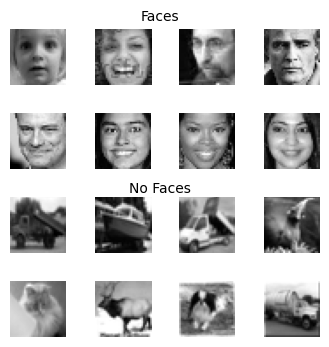

In [ ]:
faces_sel = np.random.choice(np.arange(int(data.shape[0]/2 - 1)), size = 8, replace = False)
no_faces_sel = np.random.choice(np.arange(int(data.shape[0]/2), int(data.shape[0]-1)), size = 8, replace = False)

fig, axs = plt.subplots(4,4, figsize = (4,4))
plt.subplots_adjust(hspace = 0.5, wspace = 0.5)
k = 0
for i in range(2):
  for j in range(4):
    axs[i,j].imshow(data[faces_sel[k]], cmap = 'gray')
    k+=1
k = 0
for i in range(2,4):
  for j in range(4):
    axs[i,j].imshow(data[no_faces_sel[k]], cmap = 'gray')
    k+=1

for i in range(4):
  for j in range(4):
    axs[i,j].axis('off')

fig.text(0.5, 0.9, 'Faces', ha = 'center')
fig.text(0.5, 0.47, 'No Faces', ha = 'center')
plt.show();


### Feature Extraction

Per trovare il modello di face classification in grado di fornire le prestazioni migliori sono stati testati tre tipi di Feature Extraction, selezionati tra i più utilizzati in letteratura:


1.   Histogram Oriented Gradient (HOG)
2.   Local Binary Pattern (LBP)
3. Local Binary Pattern Histograms (LBPH)



#### Histogram Oriented Gradient (HOG)

Questo metodo di Feature Extraction descrive l'immagine contando il numero di occorrenze dell'orientamento dei gradienti di intensità dei pixels in una determinata porzione dell'immagine detta cella. L'immagine è poi divisa in blocchi costituiti da celle sovrapposte i cui istogrammi sono concatenati e normalizzati al fine di rendere le features meno sensibili a variazioni di illuminazione, come dimostrato dagli ideatori di questo metodo.

Per il calcolo delle HOG Features è stata utilizzata la funzione *hog_vals( )* della libreria *scikit-image*.

Bibliografia:

[Histogram of Oriented Gradients (and car logo recognition)](https://customers.pyimagesearch.com/lesson-sample-histogram-of-oriented-gradients-and-car-logo-recognition/)

[HOG(Histogram of Oriented Gradients): An Overview](https://towardsdatascience.com/hog-histogram-of-oriented-gradients-67ecd887675f)


In [ ]:
X_hog = []

for i in range(X.shape[0]):
  hog_vals = hog(X[i],
                 orientations = 9,
                 pixels_per_cell = (4, 4),
                 cells_per_block = (2,2),
                 visualize = False,
                 feature_vector = True)
  X_hog.append(hog_vals)

  X_hog = np.array(X_hog)

In [ ]:
X_hog.shape

(47418, 1764)

In [ ]:
np.save(PATH_DRIVE+'X_hog', X_hog)

In [ ]:
X_hog = np.load(PATH_DRIVE+'X_hog.npy')

In [ ]:
X_hog.shape

(47418, 1764)

####Local Binary Pattern (LBP)
E' un metodo praticolarmente utilizzato per descrivere la texture di un'immagine.

 Il valore di ogni pixel viene confrontato con quello dei pixels vicini, il cui numero viene arbitrariamente scelto, per riempire una matrice dei confronti: se il valore del pixel centrale è maggiore di quello del pixel con cui viene confrontato nel corrispondente posto verrà inserito un 1, in caso contrario 0. Infine, i valori presenti nella matrice dei confronti sono sommati e il risultato è assegnato al pixel centrale.

Questo metodo è molto robusto alle variazioni di luminosità,inoltre è indipendente dalla rotazione e dalla dimensione dell'immagine, oltre ad essere computazionalmente efficiente.

Per il calcolo di tali features è stata utilizzata la funzione *local_binary_pattern()* di *scikit-image*.


Bibliografia:

[Understanding the Local Binary Pattern (LBP): A Powerful Method for Texture Analysis in Computer Vision](https://aihalapathirana.medium.com/understanding-the-local-binary-pattern-lbp-a-powerful-method-for-texture-analysis-in-computer-4fb55b3ed8b8)

In [ ]:
X = np.load(PATH_DRIVE + 'X.npy')

In [ ]:
X_lbp = lbp_feature_calc(X, radius = 2)

In [ ]:
X_lbp.shape

(47418, 32, 32)

In [ ]:
np.save(PATH_DRIVE + 'X_lbp', X_lbp)

#### Local Binary Pattern Histogram (LBPH)

E' una variante del metodo descritto in precedenza, anch'esso molto utilizzato nell'ambito della Face Detection e della Face Recognition.

L'immagine è divisa in celle e per ognuna di queste vengono calcolati valori di LBP che successivamente sono riportati in un istogramma. Gli istogrammi di tutte le celle in cui viene suddivisa l'immagine sono concatenati per formare un vettore di features.

Bibliografia:

[Face Recognition: Understanding LBPH Algorithm](https://towardsdatascience.com/face-recognition-how-lbph-works-90ec258c3d6b)

[DIP 07 - Image Description (4) - Texture analysis with LBP implemenation in python and skimage](https://www.youtube.com/watch?v=_5ktOnEZ3O4&t=309s)

In [ ]:
X_lbph = lbph_feature_calc(X,
                           radius = 1,
                           n_points = 8,
                           grid_x = 8,
                           grid_y = 8)

In [ ]:
X_lbph.shape

(47418, 160)

In [ ]:
np.save(PATH_DRIVE + 'X_lbph', X_lbph)

### Modello

Per ciascun metodo di Feature Extraction sono stati addestrati 5 modelli di SVM, uno per ogni tipo di kernel.
I diversi dataset sono stati precedentemente suddivisi in Train e Test Set, il primo è stato usato per effettuare la cross-validation per ciascun modello così da valutare anche l'eventuale presenza di overfitting.

I modelli sono stati confrontati valutando i valori di accuratezza, precisione e recall, quest'ultimi calcolati sia per la classe positiva che per quella negativa.

I risultati per ogni metodo di Feature Extraction sono riporatati nei grafici seguenti.

#### SVM & HOG Features

In [ ]:
X_hog = np.load(PATH_DRIVE + 'X_hog.npy')
y = np.load(PATH_DRIVE + 'y.npy')

X_train_hog, X_test_hog, y_train_hog, y_test_hog = train_test_split(X_hog,
                                                                    y,
                                                                    random_state=0,
                                                                    shuffle=True,
                                                                    test_size = 0.2)

In [ ]:
X_hog.min()
X_hog.max()

0.0

0.9999999987499999

In [ ]:
X_train_hog.shape
X_test_hog.shape
y_train_hog.shape
y_test_hog.shape

(37934, 1764)

(9484, 1764)

(37934,)

(9484,)

In [ ]:
kernels = ['linear', 'poly', 'sigmoid', 'rbf']

scores=[]

for kernel in kernels:

  model = SVC(kernel = kernel)
  score = cross_validate( X = X_train_hog,
                          y = y_train_hog,
                          estimator = model,
                          cv=5,
                          scoring = SCORING_CV,
                          return_train_score = True)

  scores.append(score)

In [ ]:
df_comp_hog = get_df_comp_CV(scores, kernels)
df_comp_hog.to_csv(PATH_DRIVE+'scores_hog.csv', index = False)

In [ ]:
for i in range(len(scores)):
  print('KERNEL: '+kernels[i]+'\n')
  score_train = scores[i]['train_accuracy'].mean()
  print(f'Accuracy TRAIN: {score_train:.3f}')
  score_test = scores[i]['test_accuracy'].mean()
  print(f'Accuracy TEST: {score_test:.3f}')
  print('\n'+' * '*10+'\n')

KERNEL: linear

Accuracy TRAIN: 1.000
Accuracy TEST: 0.994

 *  *  *  *  *  *  *  *  *  * 

KERNEL: poly

Accuracy TRAIN: 1.000
Accuracy TEST: 0.998

 *  *  *  *  *  *  *  *  *  * 

KERNEL: sigmoid

Accuracy TRAIN: 0.968
Accuracy TEST: 0.968

 *  *  *  *  *  *  *  *  *  * 

KERNEL: rbf

Accuracy TRAIN: 1.000
Accuracy TEST: 0.997

 *  *  *  *  *  *  *  *  *  * 



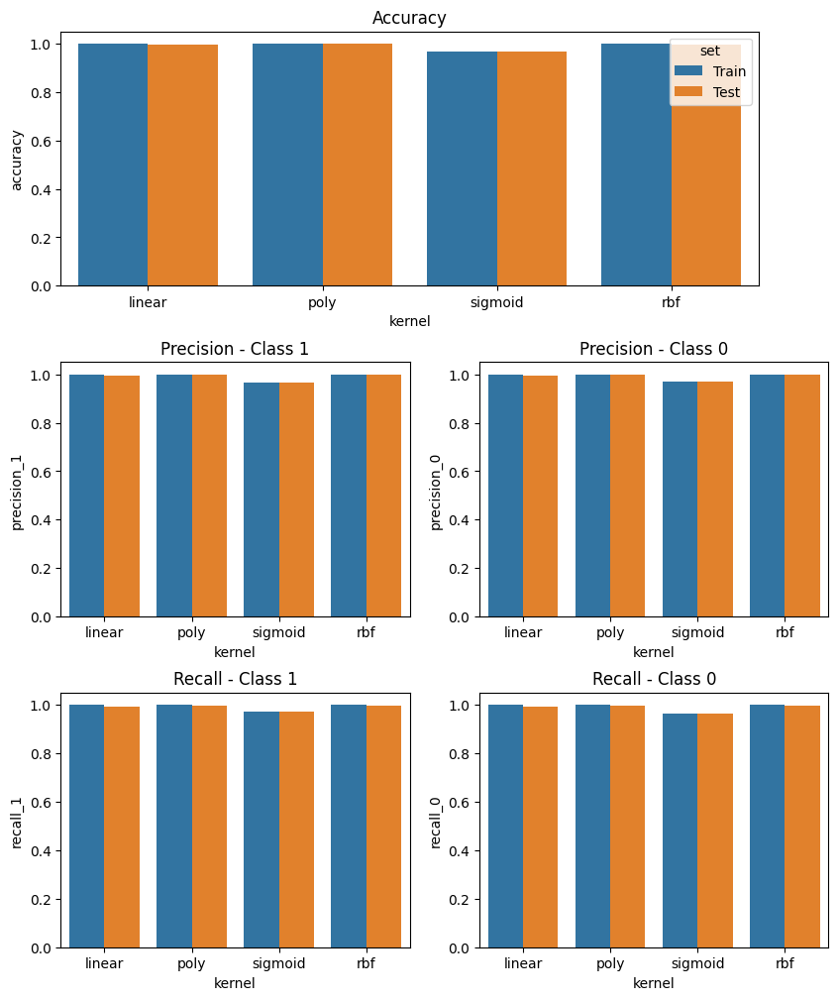

In [ ]:
plot_comp_kernel_svm(df_comp_hog)

Si nota che per tutti i kernel tutte le metriche testate sono ottime, per ciascuna di esse il valore massimo si ottiene con il kernel polinomiale. Inoltre, i valori molto simili ottenuti su Train e Test Set fanno escludere la presenza di overfitting.

#### SVM & LBP Features

In [ ]:
X_lbp = np.load(PATH_DRIVE + 'X_lbp.npy')
X_lbp_res = np.reshape(X_lbp, (X_lbp.shape[0], X_lbp.shape[1]*X_lbp.shape[2]))
X_train_lbp, X_test_lbp, y_train_lbp, y_test_lbp = train_test_split(X_lbp_res,
                                                                    y,
                                                                    random_state=0,
                                                                    shuffle=True,
                                                                    test_size = 0.2)

In [ ]:
X_train_lbp.shape
X_test_lbp.shape
y_train_lbp.shape
y_test_lbp.shape

(37934, 1024)

(9484, 1024)

(37934,)

(9484,)

In [ ]:
X_lbp.min()
X_lbp.max()

0.0

65535.0

In [ ]:
pipe_lbp = Pipeline(steps = [('scaler', MinMaxScaler()),
                             ('svc', SVC())])

In [ ]:
kernels = ['linear', 'poly', 'sigmoid', 'rbf']

scores=[]

for kernel in kernels:

  pipe_lbp.set_params(svc__kernel = kernel)

  score = cross_validate( X = X_train_lbp,
                          y = y_train_lbp,
                          estimator = pipe_lbp,
                          cv=5,
                          scoring = SCORING_CV,
                          return_train_score = True)

  scores.append(score)

Pipeline(steps=[('scaler', MinMaxScaler()), ('svc', SVC(kernel='linear'))])

Pipeline(steps=[('scaler', MinMaxScaler()), ('svc', SVC(kernel='poly'))])

Pipeline(steps=[('scaler', MinMaxScaler()), ('svc', SVC(kernel='sigmoid'))])

Pipeline(steps=[('scaler', MinMaxScaler()), ('svc', SVC())])

In [ ]:
df_comp_lbp = get_df_comp_CV(scores, kernels)
df_comp_lbp.to_csv(PATH_DRIVE+'scores_lbp.csv', index = False)

In [ ]:
for i in range(len(scores)):
  print('KERNEL: '+kernels[i]+'\n')
  score_train = scores[i]['train_accuracy'].mean()
  print(f'Accuracy TRAIN: {score_train:.3f}')
  score_test = scores[i]['test_accuracy'].mean()
  print(f'Accuracy TEST: {score_test:.3f}')
  print('\n'+' * '*10+'\n')

KERNEL: linear

Accuracy TRAIN: 0.992
Accuracy TEST: 0.973

 *  *  *  *  *  *  *  *  *  * 

KERNEL: poly

Accuracy TRAIN: 1.000
Accuracy TEST: 0.993

 *  *  *  *  *  *  *  *  *  * 

KERNEL: sigmoid

Accuracy TRAIN: 0.773
Accuracy TEST: 0.772

 *  *  *  *  *  *  *  *  *  * 

KERNEL: rbf

Accuracy TRAIN: 0.999
Accuracy TEST: 0.993

 *  *  *  *  *  *  *  *  *  * 



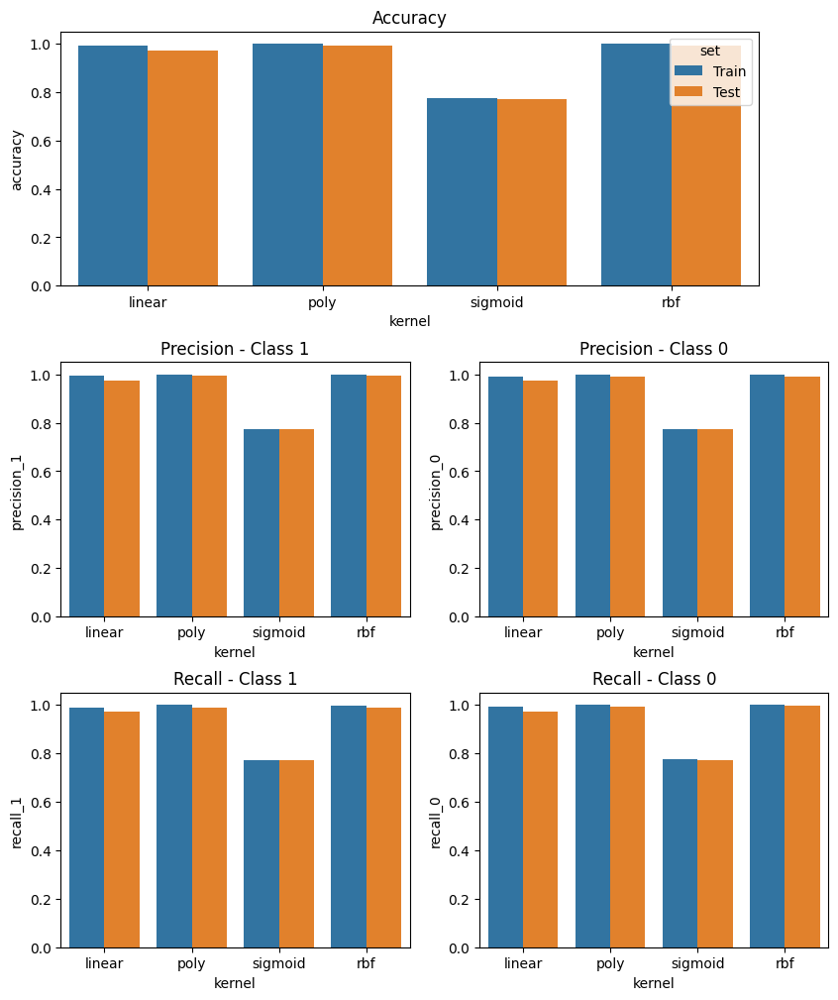

In [ ]:
plot_comp_kernel_svm(df_comp_lbp)

Anche in questo caso tutte e 5 le metriche sono molto soddisfacienti per tutti i tipi di kernel, ad eccezione di quello sigmoidale che mostra valori inferiori rispetto agli altri. Anche per questo metodo di Feature Extraction il kernel polinomiale risulta il migliore in base alle metriche scelte per la valutazione. Come in precedenza, non è presente overfitting.

#### SVM & LPBH Features

In [ ]:
X_lbph = np.load(PATH_DRIVE + 'X_lbph.npy')

X_train_lbph, X_test_lbph, y_train_lbph, y_test_lbph = train_test_split(X_lbph,
                                                                    y,
                                                                    random_state=0,
                                                                    shuffle=True,
                                                                    test_size = 0.2)

In [ ]:
X_train_lbph.shape
X_test_lbph.shape
y_train_lbph.shape
y_test_lbph.shape

(37934, 160)

(9484, 160)

(37934,)

(9484,)

In [ ]:
X_train_lbph.max()
y_train_lbph.min()

0.9999999984375001

0

In [ ]:
kernels = ['linear', 'poly', 'sigmoid', 'rbf']

scores=[]

for kernel in kernels:

  pipe_lbp.set_params(svc__kernel = kernel)

  score = cross_validate( X = X_train_lbph,
                          y = y_train_lbph,
                          estimator = pipe_lbp,
                          cv=5,
                          scoring = SCORING_CV,
                          return_train_score = True)

  scores.append(score)

Pipeline(steps=[('scaler', MinMaxScaler()), ('svc', SVC(kernel='linear'))])

Pipeline(steps=[('scaler', MinMaxScaler()), ('svc', SVC(kernel='poly'))])

Pipeline(steps=[('scaler', MinMaxScaler()), ('svc', SVC(kernel='sigmoid'))])

Pipeline(steps=[('scaler', MinMaxScaler()), ('svc', SVC())])

In [ ]:
df_comp_lbph = get_df_comp_CV(scores, kernels)
df_comp_lbph.to_csv(PATH_DRIVE+'scores_lbph.csv')

In [ ]:
for i in range(len(scores)):
  print('KERNEL: '+kernels[i]+'\n')
  score_train = scores[i]['train_accuracy'].mean()
  print(f'Accuracy TRAIN: {score_train:.3f}')
  score_test = scores[i]['test_accuracy'].mean()
  print(f'Accuracy TEST: {score_test:.3f}')
  print('\n'+' * '*10+'\n')

KERNEL: linear

Accuracy TRAIN: 0.927
Accuracy TEST: 0.925

 *  *  *  *  *  *  *  *  *  * 

KERNEL: poly

Accuracy TRAIN: 0.990
Accuracy TEST: 0.944

 *  *  *  *  *  *  *  *  *  * 

KERNEL: sigmoid

Accuracy TRAIN: 0.791
Accuracy TEST: 0.791

 *  *  *  *  *  *  *  *  *  * 

KERNEL: rbf

Accuracy TRAIN: 0.964
Accuracy TEST: 0.945

 *  *  *  *  *  *  *  *  *  * 



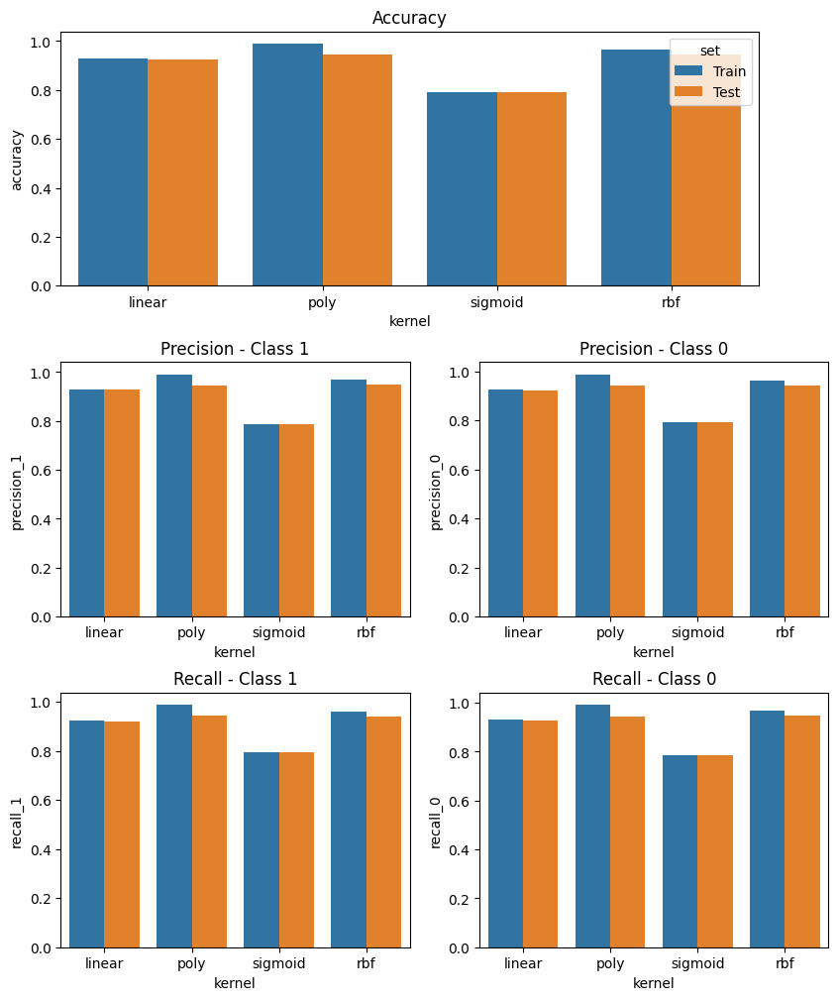

In [ ]:
plot_comp_kernel_svm(df_comp_lbph)

Come per i precedenti due metodi di Feature Extraction le metriche valutate in generale sono soddisfacienti. Come per il metodo LBP, il kernel che mostra le metriche peggiori è quello sigmoidale mentre quello con le metriche migliori il polinomiale. Anche per in questo caso non si evidenzia overfitting.

#### Scelta del modello per la classificazione

Considerati i risultati discussi in precedenza, è stato scelto di utilizzare come classificatore per valutare la presenza o meno di un volto in una determinata porzione di immagine un **SVM con kernel polinomiale** con input di **HOG** features.

Tale scelta è motivata dai valori ottenuti per le metriche considerate, che risultano i migliori tra i diversi modelli testati, e dall'analisi della letteratura in questo ambito, che vede questa soluzione, talvolta con un diverso kernel, tra le alternative ai modelli pre-addestrati più adottate.

Il modello selezionato è stato addestrato sull'intero Training Set e valutato sul Test Set; i risultati ottenuti sono riporati di seguito.

In [ ]:
#Training of the model on the Training Set
face_classificator = SVC(kernel = 'poly', probability= True)
face_classificator.fit(X_train_hog, y_train_hog)

SVC(kernel='poly', probability=True)

In [ ]:
#Saving Model
dump(face_classificator, PATH_DRIVE + 'face_classificator_hog_proba.joblib')

['/content/drive/MyDrive/MASTER DATA SCIENCE/6 - Machine Learning: tecniche avanzate/Progetto Face Detection/face_classificator_hog_proba.joblib']

In [ ]:
y_pred = face_classificator.predict(X_test_hog)

In [ ]:
print(classification_report(y_true = y_test_hog, y_pred = y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      4696
           1       1.00      1.00      1.00      4788

    accuracy                           1.00      9484
   macro avg       1.00      1.00      1.00      9484
weighted avg       1.00      1.00      1.00      9484



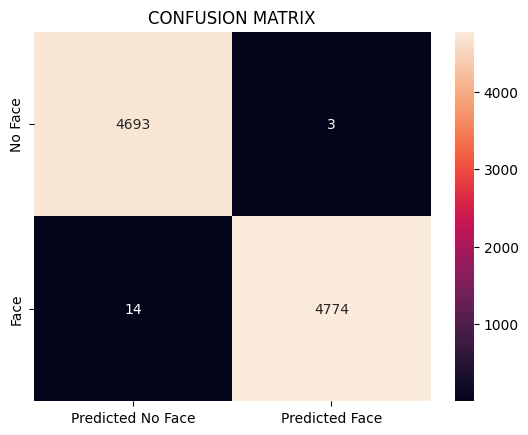

In [ ]:
plot_confusion_matrix(y_true = y_test_hog, y_predict = y_pred, labels = ['No Face', 'Face'])

I risultati ottenuti in termini di accuratezza, precisione e recall mostrati nel classification report sono eccellenti. Inoltre, dalla confusion matrix si può osservare che il modello commette solo 17 errori su 9484 immagini, di cui 3 falsi positivi e 14 falsi negativi.

#### Test del modello su un altro dataset

Il modello è stato testato su un nuovo dataset, costituito da esempi mai visti, per valutarne in modo ancora più approndito le prestazioni.
Per i volti è stato utilizzato l'[Olivetti Faces Dataset from AT&T](https://scikit-learn.org/stable/modules/generated/sklearn.datasets.fetch_olivetti_faces.html), scaricato utilizzando l'apposita funzione di *scikit-learn*, mentre per gli esempi negativi sono state estratte 400 immagini dal Test Set di CIFAR-10 di TensorFlow, così da essere certi che anche tali immagini non fossero mai state valutate dal modello.

In [ ]:
face_classificator = load(PATH_DRIVE + 'face_classificator_hog_proba.joblib')

In [ ]:
data = fetch_olivetti_faces(shuffle = True, random_state=0)

downloading Olivetti faces from https://ndownloader.figshare.com/files/5976027 to /root/scikit_learn_data


In [ ]:
data['images'].shape

(400, 64, 64)

In [ ]:
faces = data['images']

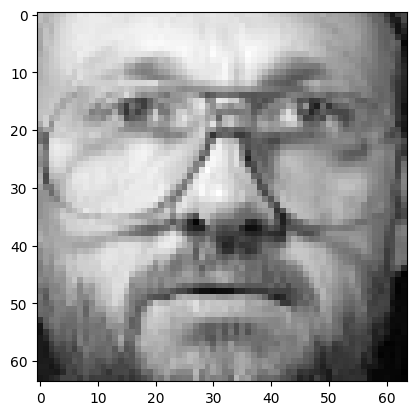

In [ ]:
plt.imshow(faces[0], cmap = 'gray')

In [ ]:
#Image Resizing to 32x32 pixel

faces_res = []

for i in range(faces.shape[0]):
  faces_res.append(cv2.resize(faces[0], dsize = (32,32)))

faces_res = np.array(faces_res)

In [ ]:
faces_res.shape

(400, 32, 32)

In [ ]:
sel_ind = np.random.choice(test_images.shape[0],
                           size = faces.shape[0],
                           replace = False)

no_faces = test_images[sel_ind]

In [ ]:
no_faces.shape

(400, 32, 32, 3)

In [ ]:
no_faces_gray = []

for i in range(no_faces.shape[0]):
  gray_scale_img = cv2.cvtColor(no_faces[i], cv2.COLOR_BGR2GRAY)
  no_faces_gray.append(gray_scale_img)

no_faces_gray = np.array(no_faces_gray)


In [ ]:
no_faces_gray.shape

(400, 32, 32)

In [ ]:
X = np.concatenate((faces_res, no_faces_gray), axis = 0)
X.shape
target = np.array([1]*faces.shape[0])
target = np.concatenate((target, np.array([0]*no_faces_gray.shape[0])), axis = 0)
target.shape

(800, 32, 32)

(800,)

In [ ]:
permutation = np.random.permutation(len(X))

X = X[permutation]
target = target[permutation]

In [ ]:
X_hog = []

for i in range(X.shape[0]):
  X_hog.append(hog_feature_calc(X[i]))

X_hog = np.array(X_hog)

In [ ]:
X_hog.shape

(800, 1764)

Di seguito sono riporatati i risultati ottenuti:

In [ ]:
y_pred = face_classificator.predict(X_hog)

In [ ]:
print(classification_report(target, y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       400
           1       1.00      1.00      1.00       400

    accuracy                           1.00       800
   macro avg       1.00      1.00      1.00       800
weighted avg       1.00      1.00      1.00       800



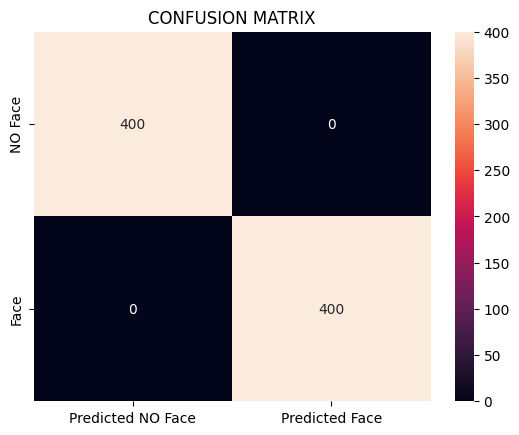

In [ ]:
plot_confusion_matrix(target, y_pred, labels = ['NO Face','Face'])

Anche con questo dataset le prestazione del modello sono ottime, infatti, come si può notare dal classification report e dalla confusion matrix non è stato commesso alcun errore di classificazione.

### Face detection

Come detto in precedenza, un sistema di Face Detection deve essere in grado di riconoscere la presenza di un volto, indipendentemente dalla sua posizione e dimensione, ed eventualmente la presenza di più volti nella stessa immagine.

L'indipendenza dalla posizione è stata soddisfatta implentando una sliding window mentre quella dalla dimensione mediante l'image pyramids. Il primo metodo prevede l'analisi non dell'intera immagini bensì di sue porzioni di una determinata dimensione ognuna delle quali verrà classificata utilizzando il modello precedentemente addestrato. Combinando questa tecnica con con l'image pyramids, che consiste nel creare più copie scalate di un determinato fattore dell'immagine di partenza, si analizzeranno diverse porzioni di immagine con localizzazione e dimensione differenti.

Nella seguente sezione sono state effettuate numerose prove su diverse immagini per valutare l'impatto del valore dei parametri di sliding window e image pyramids sulle prestazioni dell'algoritmo di Face Detection, al fine di trovarne i valori ottimali.

In particolare,i parametri valutati sono:


*   Dimensione della finestra
*   Sovrapposizione delle finestre durante lo scorrimento
* Fattore di scala applicato nell'image pyramids

Per questa fase di degug e tuning sono state appositamente create tre funzioni:
*  face_detector( ): classifica ciascuna finestra usando il modello di face classification e restituisce le finestre appartenti alla classe 1 (Volti)
* plot_bounding_boxes( ): mostra l'immagine di partenza e il contorno delle aree identificate come volto, eventualmente con la probabilità assaciata alla classe 1.
* plot_win_faces( ): mostra singolarmente tutte le porzioni di immagine identificate come volti e la probabilità associata alla classe 1.

Bibliografia:

[Sliding Windows for Object Detection with Python and OpenCV](https://pyimagesearch.com/2015/03/23/sliding-windows-for-object-detection-with-python-and-opencv/)

[Image Pyramids with Python and OpenCV](https://pyimagesearch.com/2015/03/16/image-pyramids-with-python-and-opencv/)


In [ ]:
img = cv2.imread(PATH_DRIVE+'test_images/selfie_1.jpg')

In [ ]:
img.shape

(720, 1280, 3)

In [ ]:
len(img.shape)

3

In [ ]:
img = cv2.imread(PATH_DRIVE+'test_images/selfie_1.jpg')
face_classificator = load(PATH_DRIVE + 'face_classificator_hog_proba.joblib')
faces_bb, faces_ww = face_detector(img, ds = 1.2, win_size = (128,128), stepsize = 32)

In [ ]:
len(faces_ww)

4

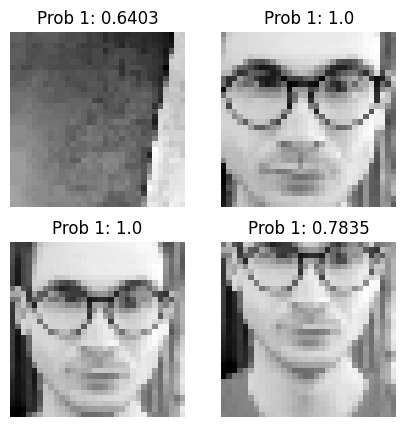

In [ ]:
plot_win_faces(faces_ww, faces_bb, 2, 2, (5,5))

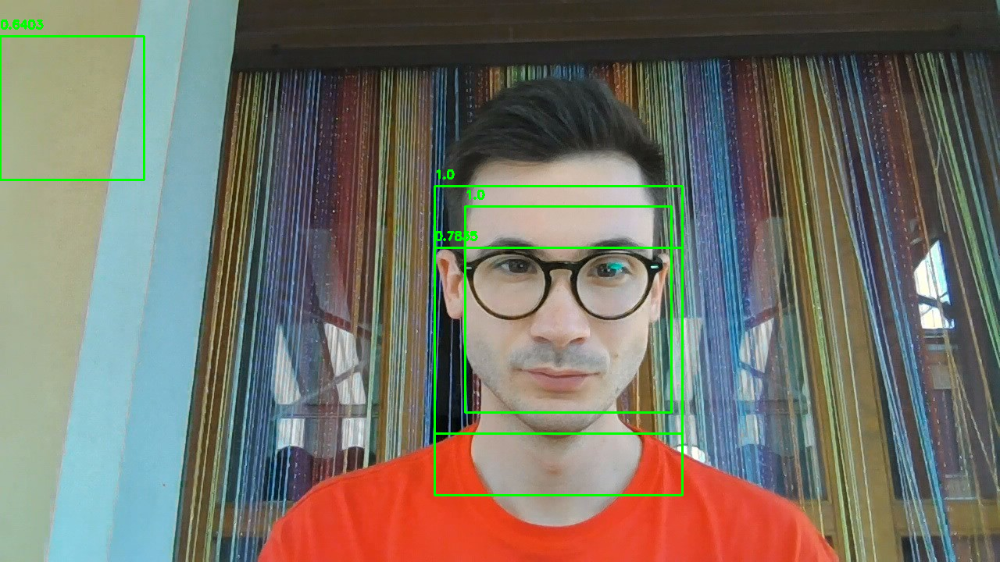

In [ ]:
plot_bounding_boxes(img, faces_bb, win_size = (128,128), show_proba=True)

In [ ]:
# img = cv2.imread(PATH_DRIVE+'test_images/selfie_1.jpg')
# face_classificator = load(PATH_DRIVE + 'face_classificator_hog_proba.joblib')
faces_bb, faces_ww = face_detector(img, ds = 1.2, win_size = (256,256), stepsize = 32)
len(faces_bb)

12

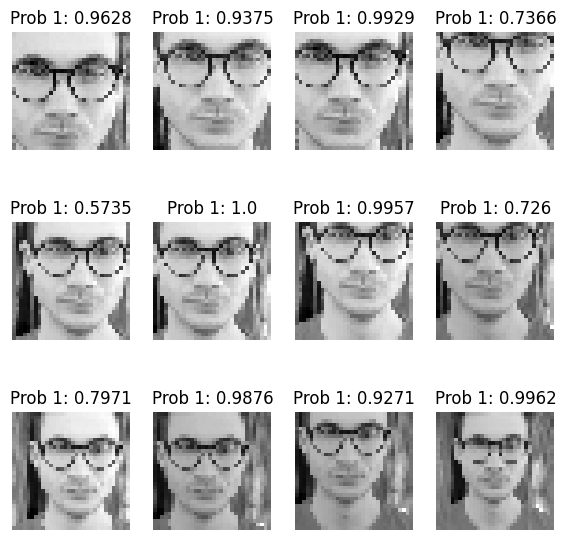

In [ ]:
plot_win_faces(faces_ww, faces_bb, 3, 4, (7,7))

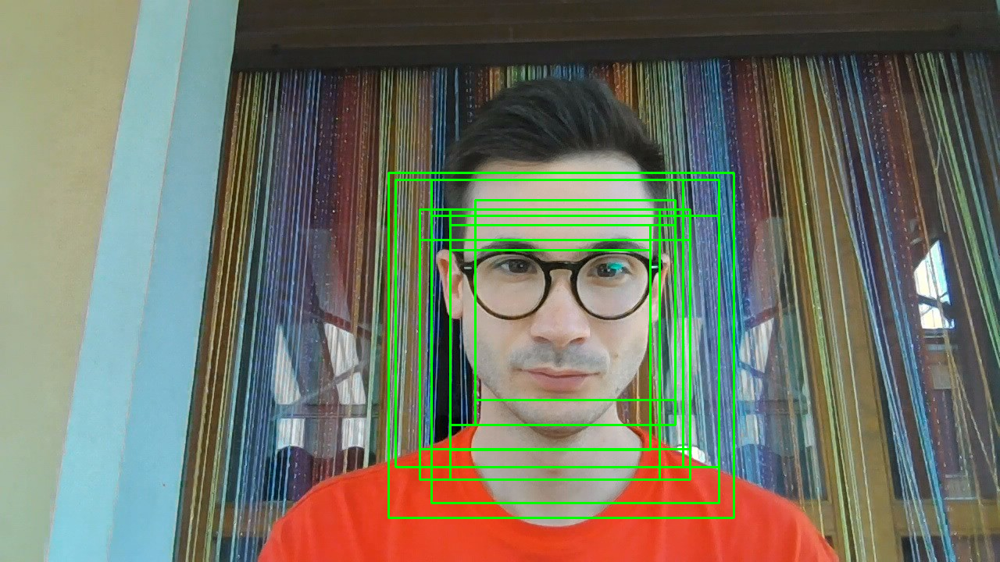

In [ ]:
plot_bounding_boxes(img, faces_bb, win_size = (256,256))

In [ ]:
faces_bb, faces_ww = face_detector(img, ds = 1.2, win_size = (256,256), stepsize = 64)
len(faces_bb)

3

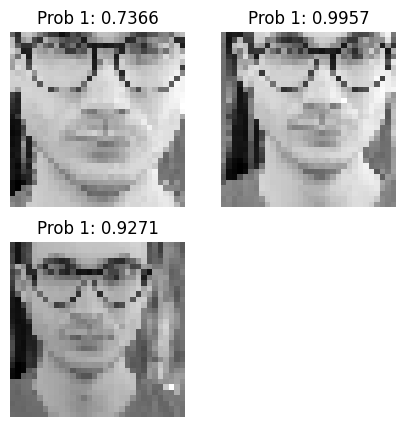

In [ ]:
plot_win_faces(faces_ww, faces_bb, 2, 2, (5,5))

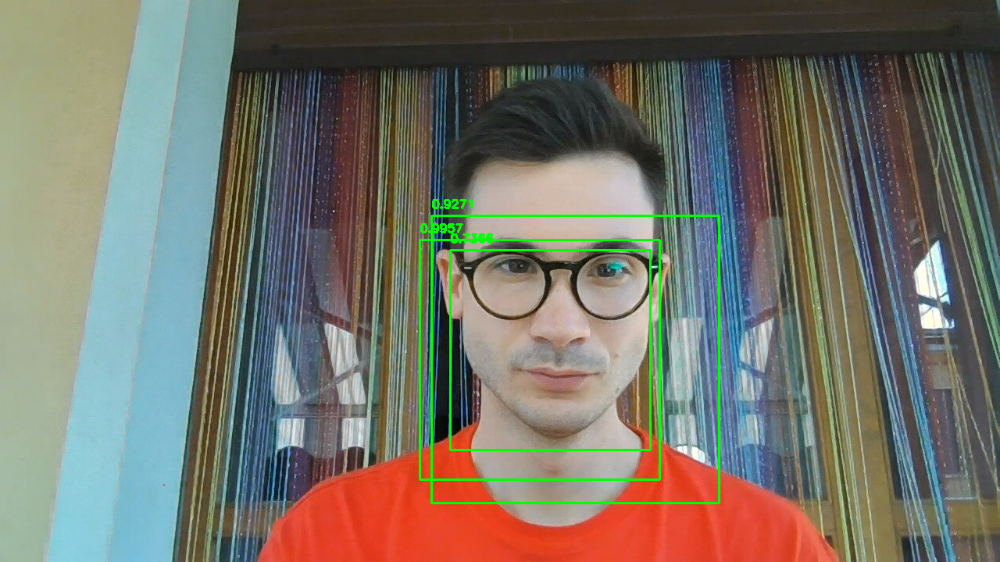

In [ ]:
plot_bounding_boxes(img, faces_bb, win_size = (256,256), show_proba=True)

In [ ]:
img = cv2.imread(PATH_DRIVE+'test_images/selfie_1.jpg')
faces_bb, faces_ww = face_detector(img, ds = 1.5, win_size = (128,128), stepsize = 32)
len(faces_bb)

1

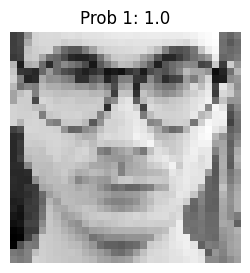

In [ ]:
plot_win_faces(faces_ww, faces_bb, 1,1,(3,3))

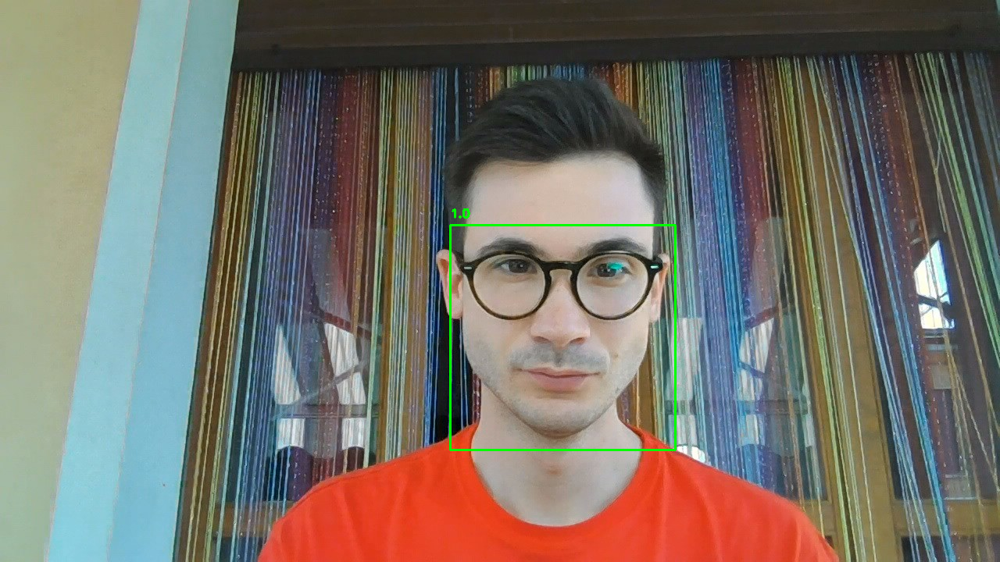

In [ ]:
plot_bounding_boxes(img, faces_bb, win_size = (128,128), show_proba = True)

In [ ]:
img = cv2.imread(PATH_DRIVE+'test_images/selfie_oscar.jpg')
# face_classificator = load(PATH_DRIVE + 'face_classificator_hog_proba.joblib')
faces_bb, faces_ww = face_detector(img, ds = 1.2, win_size = (64,64), stepsize = 16)
len(faces_bb)

21

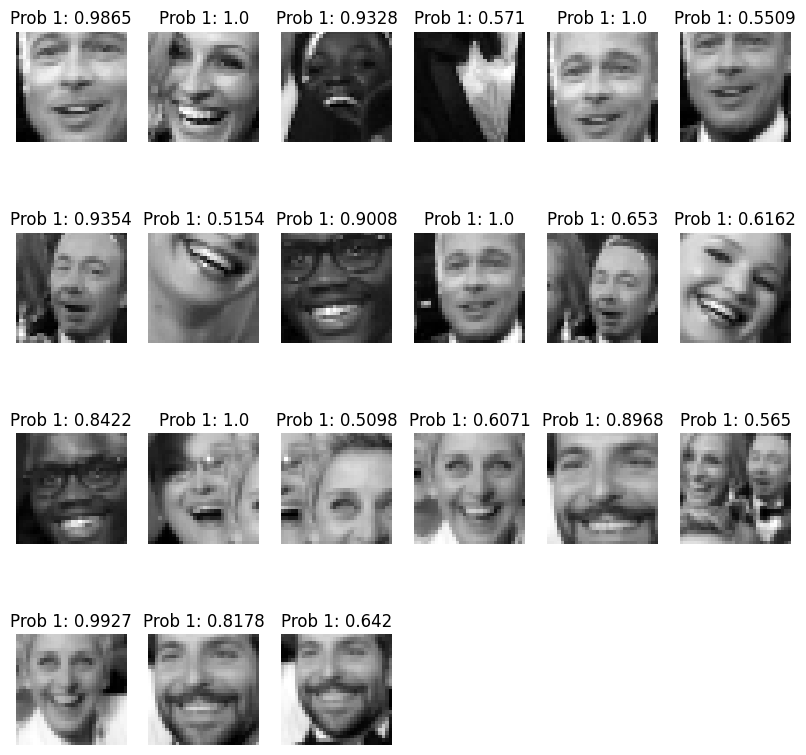

In [ ]:
plot_win_faces(faces_ww, faces_bb, 4, 6, (10,10))

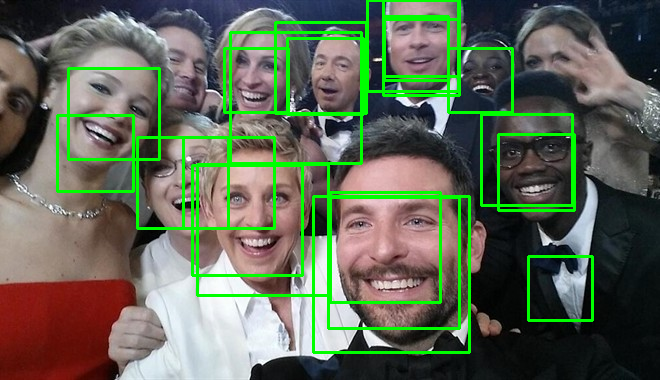

In [ ]:
plot_bounding_boxes(img, faces_bb, win_size = (64,64))

In [ ]:
img = cv2.imread(PATH_DRIVE+'test_images/selfie_2.jpg')
faces_bb, faces_ww = face_detector(img, ds = 1.2, win_size = (128,128), stepsize = 32)
len(faces_bb)

6

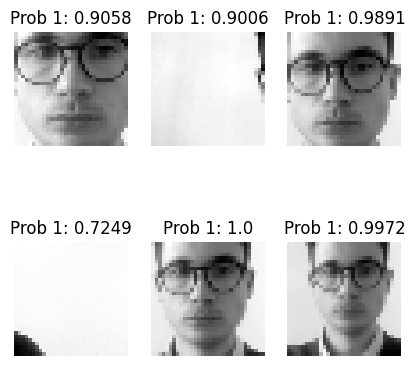

In [ ]:
plot_win_faces(faces_ww, faces_bb, 2,3,(5,5))

In [ ]:
plot_bounding_boxes(img, faces_bb, win_size = (128,128), show_proba = True)

In [ ]:
img = cv2.imread(PATH_DRIVE+'test_images/selfie_2.jpg')
faces_bb, faces_ww = face_detector(img, ds = 1.5, win_size = (128,128), stepsize = 32)
len(faces_bb)

1

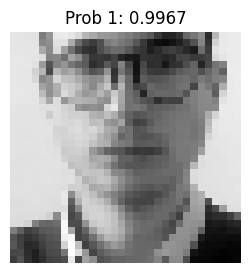

In [ ]:
plot_win_faces(faces_ww, faces_bb, 1,1,(3,3))

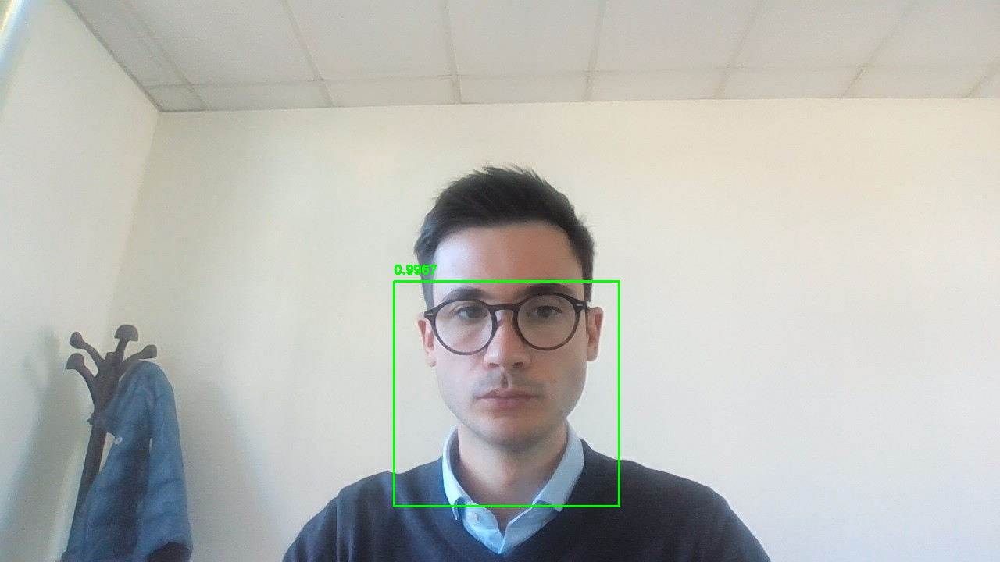

In [ ]:
plot_bounding_boxes(img, faces_bb, win_size = (128,128), show_proba = True)

Dalle prove mostrate si evince che tutti e tre i parametri influenzano in modo sostanziale le prestazioni dell'algortimo di Face Detection. In particolare, si nota che a seconda del tipo di immagine selezionata, uno o più volti presenti, della dimensione del volto e dell'immagine cambiano i valori dei parametri che consentono di ottenere le prestazioni migliori.

Per quanto riguarda i falsi positivi, sebbene non siano molti, si tenterà di ridurne il numero variando la soglia utilizzata per la classificazione.

Infine, si osserva che l'algoritmo riconsce e, di conseguenza,mostra più bounding boxes dello stesso volto; per risolvere questo problema sarà applicata la Non Maximum Suppression (NMS).

#### Non Maximum Suppression (NMS)

Questo metodo molto diffuso nell'ambito della Computer Vision consente di eliminare le bounding boxes sovrapposte in base al rapporto tra l'intersezione e l'unione (IoU) di ogni finestra rispetto alle altre. Tale rapporto sarà pari a 1 in caso di finestre completamente sovrapposte e a 0 per finestre senza alcuna sovrapposizione.

A tal scopo è stata utilizzata la funzione di *OpenCV* *NMSBoxes( )* il cui parametro *nms_threshold* corrisponde al valore di IoU oltre il quale la finestra con il grado di confidenza minore viene non viene considerata.

Nell'esempio seguente è stata applicata su un'immagine di prova.

Bibliografia:

[Non-maximum Suppression (NMS)](https://towardsdatascience.com/non-maximum-suppression-nms-93ce178e177c)

[Non-Maximum Suppression for Object Detection in Python](https://pyimagesearch.com/2014/11/17/non-maximum-suppression-object-detection-python/)





In [ ]:
img = cv2.imread(PATH_DRIVE+'test_images/selfie_oscar.jpg')
# face_classificator = load(PATH_DRIVE + 'face_classificator_hog_proba.joblib')
faces_bb, proba, faces_ww = face_detector(img, ds = 1.2, win_size = (64,64), stepsize = 16)
len(faces_bb)

21

##### No NMS

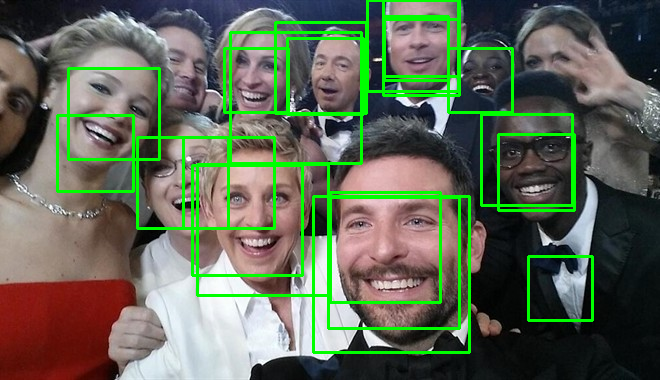

In [ ]:
plot_bounding_boxes(img, faces_bb, proba, win_size = (64,64))

##### Con NMS

In [ ]:
indices = cv2.dnn.NMSBoxes(bboxes = faces_bb.astype(float),
                           scores = proba,
                           score_threshold = 0.5,
                           nms_threshold=0.5)

In [ ]:
indices.shape

(9,)

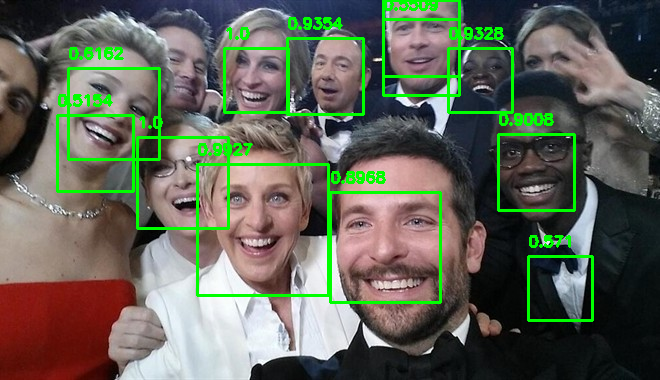

In [ ]:
plot_bounding_boxes(img, faces_bb[indices], proba[indices], win_size = (64,64), show_proba = True)

Si nota come l'introduzione della NMS produca un notevole miglioramento del risultato ottenuto.

#### Definizione e Test della funzione *face_detection( )*

La funzione *face_detection( )* è stata definita al fine di unire ed attuare in successione tutte le operazioni descritte nelle sezioni precedenti su un'immagine di input.

I principali passaggi che vengono eseguiti sono:
1. Eventuale ridimesionamento dell'immagine per riportare il lato più lungo a 660 pixels
2. Eventuale conversione in bianco e nero
3. Calcolo delle HOG features
4. Sliding Window & Image Pyramids per definire la finestra su cui eseguire la classificazione
5. Face Classification su ogni finestra e memorizzazione delle coordinate delle finestre classificate come positive
6. Grafico dell'immagine e delle Bounding Boxes dei volti identificati con relativo grado di confidenza (Probabilità della classe positiva)

Si è deciso di ridimensionare tutte le immagini con lato lungo diverso da 660 px in quanto, come detto nella sezione precedente, i valori dei parametri di Sliding Window e Image Pyramids associati alle migliori performance dell'algoritmo dipendono anche dalla dimensione dell'immagine.
La dimensione di 660 pixels per il lato lungo è stata scelta prendendo come riferimento l'immagine del selfie della notte degli Oscar, utilizzata in molte prove, così da ottimizzare i anche tutti gli altri parametri su quest'immagine.

Inoltre, la soglia per la classificazione per la classe positiva è stata alzata a 0.6 per ridurre il numero di falsi positivi; tale valore è stato scelto sulla base dei valori del grado di confidenza dei falsi positivi ottenuti nelle prove effettuate.

In generale, tutti i valori di default della funzione *face_detection( )* sono stati scelti utilizzando come riferimento l'immagine del selfie della notte degli Oscar.

Di seguito, sono riporati esempi di applicazione di tale funzione su diverse immagini.














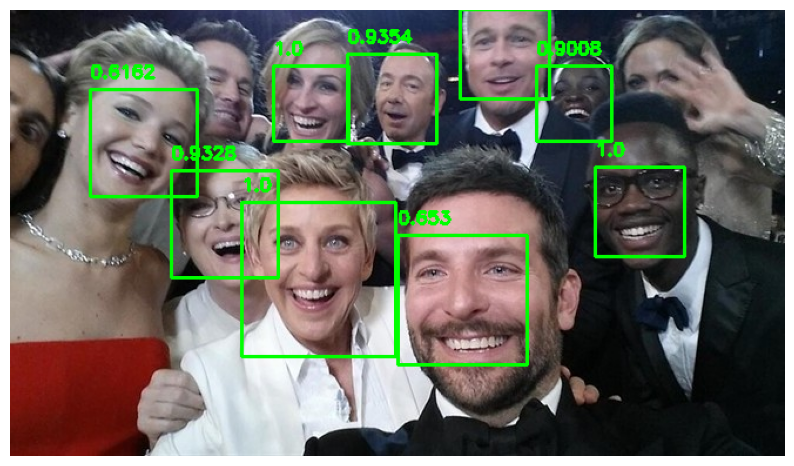

In [ ]:
img = cv2.imread(PATH_DRIVE+'test_images/selfie_oscar.jpg')
face_classificator = load(PATH_DRIVE + 'face_classificator_hog_proba.joblib')
faces_bb = face_detection(img)

Si osserva che vengono identificati correttamente 9 volti su 10, risultato più che soddisfaciente considerando che il volto non riconosciuto è particolarmente occluso. Inoltre, si nota che, grazie all'aumento del valore della soglia di classificazione, non sono più presenti falsi positivi.

La funzione è stata testata anche su immagini contententi un solo volto:

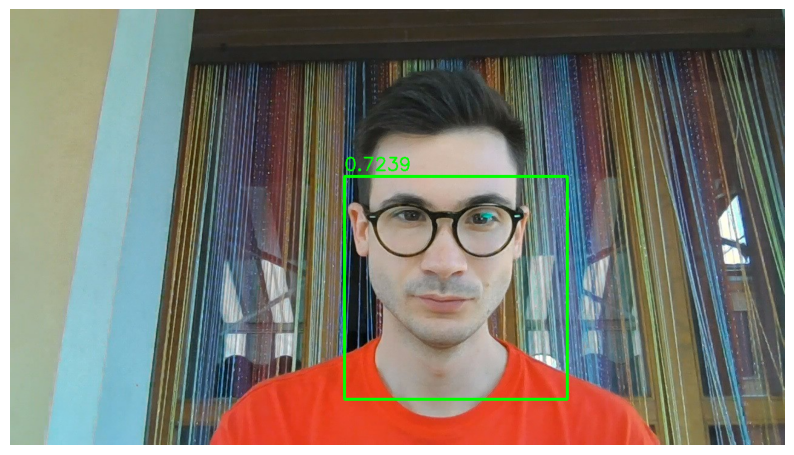

In [ ]:
img = cv2.imread(PATH_DRIVE+'test_images/selfie_1.jpg')
face_classificator = load(PATH_DRIVE + 'face_classificator_hog_proba.joblib')
faces_bb = face_detection(img)

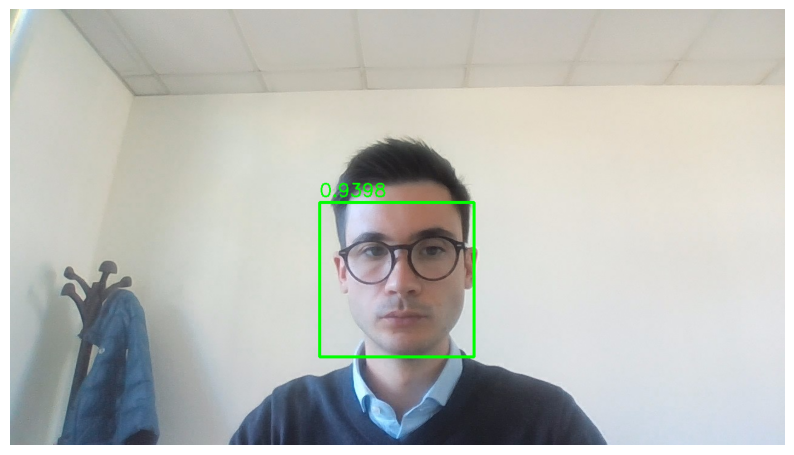

In [ ]:
img = cv2.imread(PATH_DRIVE+'test_images/selfie_2.jpg')
face_classificator = load(PATH_DRIVE + 'face_classificator_hog_proba.joblib')
faces_bb = face_detection(img)

In entrambi i casi la funzione identifica correttamente il volto presente.

Successivamente, la funzione è stata provata su un'immagine contente due soggetti, ottenendo anche in questo caso una corretta classificazione.

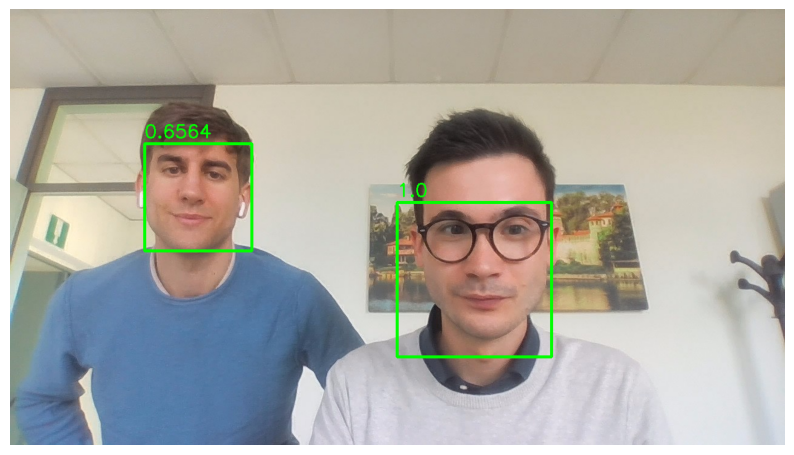

In [ ]:
img = cv2.imread(PATH_DRIVE+'test_images/selfie_3.jpg')
face_classificator = load(PATH_DRIVE + 'face_classificator_hog_proba.joblib')
faces_bb = face_detection(img)

In quest'immagine, invece, oltre alla buonding box corretta viene considerato come volto anche una porzione di esso.

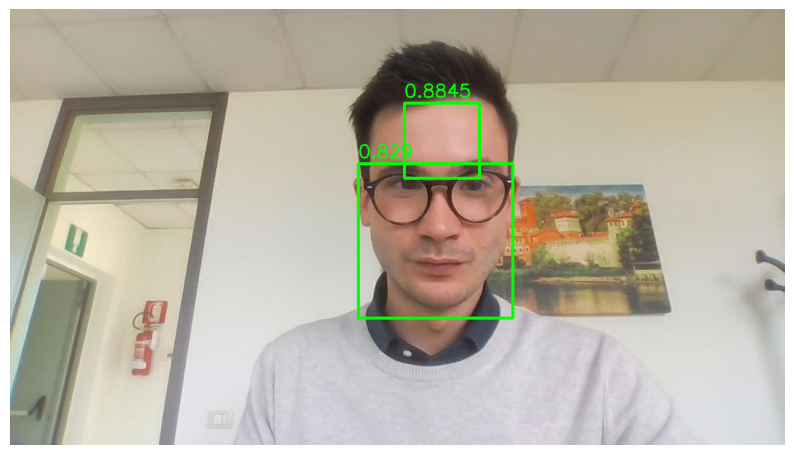

In [ ]:
img = cv2.imread(PATH_DRIVE+'test_images/selfie_4.jpg')
face_classificator = load(PATH_DRIVE + 'face_classificator_hog_proba.joblib')
faces_bb = face_detection(img)

In questo test si è valutata la capacità della funzione di identificare un volto quando questo si trova a distanze diverse dalla fotocamera:

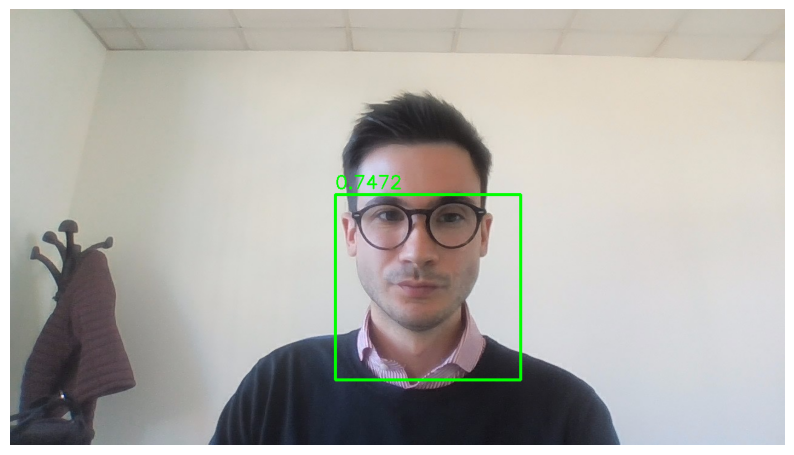

In [ ]:
img = cv2.imread(PATH_DRIVE+'test_images/selfie_5.jpg')
face_classificator = load(PATH_DRIVE + 'face_classificator_hog_proba.joblib')
faces_bb = face_detection(img)

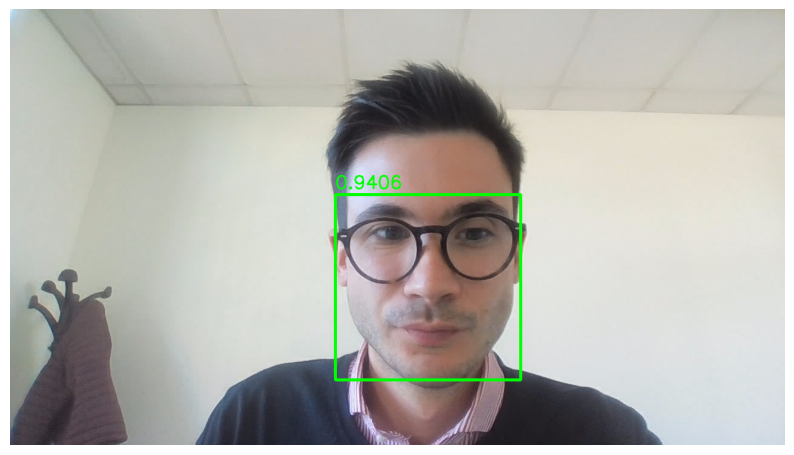

In [ ]:
img = cv2.imread(PATH_DRIVE+'test_images/selfie_6.jpg')
face_classificator = load(PATH_DRIVE + 'face_classificator_hog_proba.joblib')
faces_bb = face_detection(img)

In entrambe le situazioni il volto, più o meno vicino, viene identificato correttamente.

Nei due esempi di applicazione seguenti la funzione è stata testata su foto verticali, con il soggetto più o meno vicino:

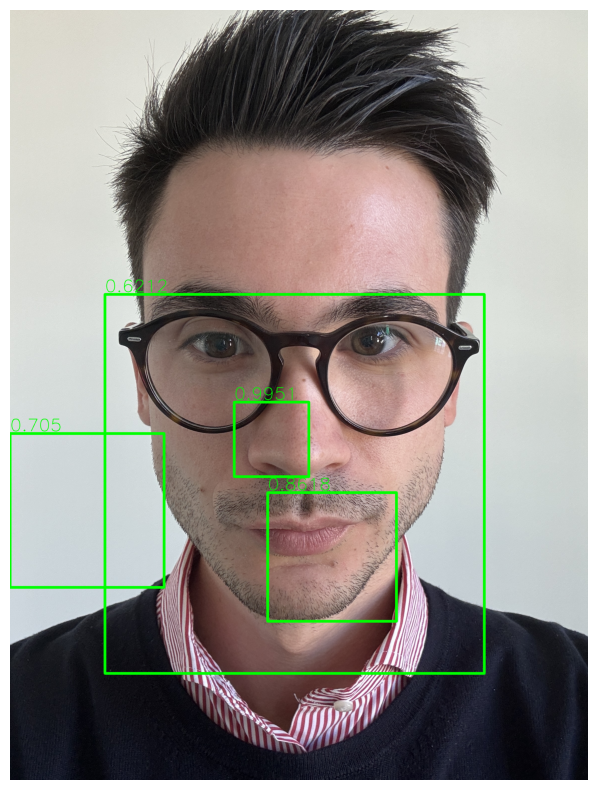

In [ ]:
img = cv2.imread(PATH_DRIVE+'test_images/selfie_7.JPG')
face_classificator = load(PATH_DRIVE + 'face_classificator_hog_proba.joblib')
faces_bb = face_detection(img)

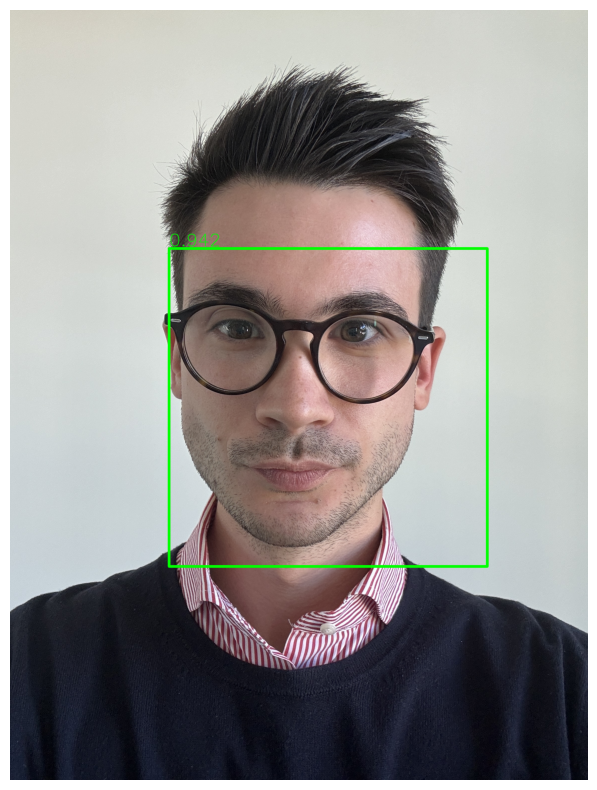

In [ ]:
img = cv2.imread(PATH_DRIVE+'test_images/selfie_8.JPG')
face_classificator = load(PATH_DRIVE + 'face_classificator_hog_proba.joblib')
faces_bb = face_detection(img)

Nel primo caso, con il soggetto pù vicino, oltra alla finestra che contiene effettivamente il volto vengono classificate come tali anche due finestre che ne contengono solo una porzione, oltre a un falso positivo. Nel secondo caso con il soggetto più distante, invece, il volto viene identificato correttamente.

### Conclusioni

In conclusione, con questo progetto si è tentato di realizzare un algortimo di Face Detection, i cui risultati sono stati testati su diverse immagini di prova. Considerati i vincoli progettuali descritti nell'introduzione, i risultati ottenuti sono soddisfacienti; la funzione proposta, infatti, è stata in grado di identificare la quasi totalità dei volti, anche in situazioni differenti tra loro, con un numero ridotto di falsi positivi.

Si ritiene che le prestazioni di tale algoritmo possano essere ulteriormente migliorate in seguito ad un tuning dei parametri specifico in base al campo di utilizzo, per esempio per idenficare un singolo volto o volti in un determinato range di distanze dalla fotocamera.
Tuttavia, trattandosi di un prototipo, si è preferito trovare dei parametri in grado fornire prestazioni più che accettabili su un set eterogeneo di immagini.